# Working with network data

**Author**: Andrea Ballatore (Birkbeck, University of London)

**Abstract**: Learn how to load, process, analyse, and save network data using Python packages.

**Credits**: Some ideas and examples from:
- https://automating-gis-processes.github.io/site/notebooks/L6/network-analysis.html
- https://www.cl.cam.ac.uk/teaching/1314/L109/tutorial.pdf
- https://programminghistorian.org/en/lessons/exploring-and-analyzing-network-data-with-python
-  https://briandew.wordpress.com/2016/06/15/trade-network-analysis-why-centrality-matters/

## Setup
This is to check that your environment is set up correctly (it should print 'env ok', ignore warnings).

In [1]:
# Test geospatial libraries
# check environment
import os
print("Conda env:", os.environ['CONDA_DEFAULT_ENV'])
if os.environ['CONDA_DEFAULT_ENV'] != 'geoprogv1':
    raise Exception("Set the environment 'geoprogv1' on Anaconda. Current environment: " + os.environ['CONDA_DEFAULT_ENV'])

# spatial libraries 
import fiona as fi
import pandas as pd
import geopandas
import pysal as sal
import math
import geoplot
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import DivergingNorm
import osmnx
import networkx as nx
import random
import gzip

# create tmp folder
if not os.path.exists('tmp'):
    os.makedirs('tmp')
# make sure the 'data' folder exists
if not os.path.exists('data'):
    os.makedirs('data')

print('env ok')

Conda env: geoprogv1
env ok


## Python packages for network analysis

- As usual, in Python we use a **combination** of highly specialised packages to achieve a goal.
- `networkx` (imported as `nx`): One of the main packages to work on network data (https://networkx.org).
- `osmnx`: A package to extract network data from OpenStreetMap and manipulate it in `networkx` for complex network analysis (https://github.com/gboeing/osmnx).
- These packages support some of the same functionality implemented in the famous [ESRI's ArcGIS Network Analyst](https://www.esri.com/en-us/arcgis/products/arcgis-network-analyst/).

----
## Network science

### Graph theory

- **Networks**, also known as **graphs**, are a core data structure that allow to represent systems.
- A **node** (also called vertex) is an element of the network that represents a entity (e.g., a person, a vehicle, an animal, a station, an organisation).
- An **edge** (also called link) is a connection between two nodes and can have attributes. An edge represent a relationship between two nodes (e.g., a friendship between two people, a railway between two train stations, a call between two phone users).
- An edge can be **directed** (`a --> b` and `b --> a` are two separate edges) or **undirected** (`a -- b` does not have a direction).
- `networkx` supports the creation of different types of networks and provides implementations of many graph algorithms and metrics.

### Graph problems
- For centuries, **graph theory** has provided insights about the properties of these structures from a formal perspective.
- Graph theory is an important branch of mathematics. One of the earliest instances of graph theoretical problems is the seven bridges of Königsberg. _Is there a path that crosses every bridge exactly once?_
Leonhard Euler (1735) demonstrated that such a walk did not exist by formulating the problem as a graph (see an [explanation of his solution](https://www.maa.org/press/periodicals/convergence/leonard-eulers-solution-to-the-konigsberg-bridge-problem)):

<img src="img/7bridges.png" />

- Another network problem related to Euler's seven bridges is the **Travelling Salesman Problem (TSP)**: "Given a list of cities and the distances between each pair of cities, what is the shortest possible route that visits each city exactly once and returns to the origin city?". 
- This apparently simple problem puzzles scientists in operations research and computer science since the 1930s and has no known optimal solution (_NP-hard_). Only sub-optimal solutions exist.
- Variations of the TSP are commonly used in logistics, for example to coordinate fleets of taxis transporting passengers.
- Networks can intuitively represent human systems (e.g., social networks, communication networks, trade networks, street networks) and natural systems (e.g., molecular structures, biological networks, ecological networks). Example: [network analysis of Game of Thrones characters](https://predictivehacks.com/social-network-analysis-of-game-of-thrones/).

### Small world and scale-free networks

- From the 1990s, **network science** has become one of the most active cross-disciplinary areas of scientific research, studying complex systems in an innovative way. 
- Famously, **small world networks** are a class of networks that are "highly clustered, like regular lattices, yet have small characteristic path lengths, like random graphs." (Watts and Strogatz, 1998). These networks exhibit regional structures and efficient information transfer, as every node is connected to every other node in short paths. "Social networks are intuitive examples of this organization, in which cliques or clusters of friends being interconnected but each person is really only five or six people away from anyone else" [(Telesford et al 2011)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3604768/).
- Albert-László Barabási is one of the most cited scientists in the 21st century. "He introduced in 1999 the concept of **scale-free networks** and proposed the Barabási–Albert model to explain their widespread emergence in natural, technological and social systems, from the cellular telephone to the World Wide Web or online communities" (http://networksciencebook.com). Watch this [interview with Barabási](https://www.youtube.com/watch?v=zvzRnXd19nk).
- A scale-free network is a network whose degree distribution follows a power law: Some nodes are very densely connected, while most nodes have few connections:

<img src="img/scale_free_network.png" width=400 />

- In geographic data science, **geospatial networks** are networks in which the location of nodes and edges is necessary to study them and use them for analysis. 
- Such networks are ubiquitous and include transport networks, hydrological networks, origin-destination matrices (flow data), energy networks, and trade networks.

### Network algorithms

- One of the fundamental problems in graphs is the calculation of the **shortest path between two nodes**. This problem has countless applications in the geospatial sector, including routing from point A to B.
- Since 1956, **Dijkstra's algorithm** has been the most famous way to calculate a shortest path in a weighted graph:

<img src="img/Dijkstra_Animation.gif" /> 

([source](https://en.wikipedia.org/wiki/Dijkstra%27s_algorithm))
- Other shortest-path algorithms are also available (https://networkx.org/documentation/stable/reference/algorithms/shortest_paths.html).

## Creating and analysing graphs

### Graph creation

- Let us create a graph with **weighted edges**. Weights can represent for example the cost of traversing an edge (e.g., a long edge has a higher weight than a short one) and are used very often to represent systems.
- In some scenarios, graphs can be created and populated directly with `networkx`:

In [2]:
# create simple undirected graph
g = nx.Graph(name='small graph')
# add edges with 1 attribute (weight)
g.add_edge('a', 'b', weight=0.1)
g.add_edge('b', 'c', weight=1.5)
g.add_edge('a', 'c', weight=1.0)
g.add_edge('c', 'd', weight=2.2)

print(nx.info(g))

Name: small graph
Type: Graph
Number of nodes: 4
Number of edges: 4
Average degree:   2.0000


- Particularly for small networks, it is possible to **plot** them directly.
- Note that this undirected graph is non-spatial, in the sense that nodes do not have a fixed spatial location.

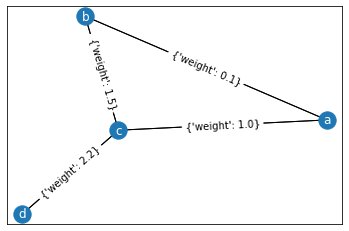

In [3]:
# generate positions of nodes using a well-known layout:
pos = nx.spring_layout(g)
# open drawing
nx.draw_networkx(g, pos=pos, font_color='white')
# draw edge labels
nx.draw_networkx_edge_labels(g, pos=pos)
# draw edges
nx.draw_networkx_edges(g, pos=pos)
# show graph
plt.show()

- The elements of the graph can be access directly, as shown at 
https://networkx.org/documentation/stable/tutorial.html:

In [4]:
g.nodes

NodeView(('a', 'b', 'c', 'd'))

In [5]:
g.edges

EdgeView([('a', 'b'), ('a', 'c'), ('b', 'c'), ('c', 'd')])

In [6]:
# see neighbouring nodes to node 'a':
for node_nei in g.neighbors('a'):
    print(node_nei)

b
c


In [7]:
# access attributes
weights = nx.get_edge_attributes(g, 'weight')
weights

{('a', 'b'): 0.1, ('a', 'c'): 1.0, ('b', 'c'): 1.5, ('c', 'd'): 2.2}

- Now, we can use `networkx` to calculate the shortest path between nodes.
- First, we can calculate the **unweighted shortest path**, imagining that all edges have the same weight:

In [8]:
unweighted_path = nx.shortest_path(g, 'b', 'd')
unweighted_path

['b', 'c', 'd']

- Second, we can see the **weighted shortest path**, noting that the sum of weights of (bacd) is lighter than (bcd):

In [9]:
weighted_path = nx.shortest_path(g, 'b', 'd', weight='weight')
weighted_path

['b', 'a', 'c', 'd']

### Network metrics

- To describe and understand networks, many metrics have been created.
- For example, we can see how many edges are connected to a node (the **degree** of a node). Node `a` has two edges, `c` has 3. Some high-degree nodes are "hubs", connecting many nodes: For example, in social networks, politicians are hubs.
- The **centrality** of a node is also important: How many "hops" on edges are necessary to reach _all other nodes_? For example, London is a more central air travel hub than any other city in the UK; Important scientists are more central in the citation network of scientific articles (see [centrality metrics](https://networkx.org/documentation/stable/reference/algorithms/centrality.html)).

In [10]:
# extract all degrees: this is usually an important piece
# of information to understand the structure of the graph.
g.degree()

DegreeView({'a': 2, 'b': 2, 'c': 3, 'd': 1})

In [11]:
# extract the degrees into a simple list
degrees = [deg for node, deg in g.degree()]
degrees

[2, 2, 3, 1]

In [12]:
# 'c' is the most central node, as we can reach all other nodes in
# the smallest number of hops, while 'd' is the most isolated node.
nx.algorithms.centrality.degree_centrality(g)

{'a': 0.6666666666666666,
 'b': 0.6666666666666666,
 'c': 1.0,
 'd': 0.3333333333333333}

- Another popular metric of centrality is **betweeness centrality** is based on shortest paths between nodes (see [documentation](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.betweenness_centrality.html) for details).
- **Edge weights** can be important to calculate centrality and other metrics. Note that in some situations (e.g., routing), edge weights represent a _cost_ (high values mean longer segments), while in others they represent the intensity of _interactions_ (e.g., passenger flows between airports, high values represent more traffic).

In [13]:
# centrality of nodes
nx.algorithms.centrality.betweenness_centrality(g, weight='weight')
# 'a' and 'b' are the most central nodes of the graph

{'a': 0.6666666666666666, 'b': 0.0, 'c': 0.6666666666666666, 'd': 0.0}

In [14]:
# centrality of edges
nx.algorithms.centrality.edge_betweenness_centrality(g, weight='weight')
# 'ac' is the most central edge of the graph

{('a', 'b'): 0.5,
 ('a', 'c'): 0.6666666666666666,
 ('b', 'c'): 0.0,
 ('c', 'd'): 0.5}

## Trade networks

- Network science is applied very successfully to model interactions in economics, sociology and other fields.
- The data from this analysis represents trade interactions between pairs of countries (for example, animal trade between Argentina and Brazil in 2017). It was extracted from the World Bank's **World Integrated Trade Solution (WITS)** ([source](https://github.com/andrea-ballatore/open-geo-data-education/tree/main/datasets/global_trade_networks)).
- Note that this data is accurate but highly incomplete. The networks obtained from this data will provide a biassed view on world trade.

In [15]:
trade_df = pd.read_csv('data/trade_network_wits-1988_2018.tsv', sep='\t')
trade_df.sample(4)

,partner,reporter,product_categories,indicator_type,indicator,2018,2017,2016,2015,2014,...,1995,1994,1993,1992,1991,1990,1989,1988,reporter_country_code,partner_country_code
10443,United Arab Emirates,Armenia,all_products,import,partner_share_pc_top_5_import_partner,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ARM,ARE
14260,World,Cote d'Ivoire,fuels,export,export_product_share_pc,15.93,12.51,12.46,16.81,20.29,...,9.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CIV,Wld
21790,World,St. Lucia,all_products,trade_indicator,country_growth_pc,NaN,-24.20,-9.42,-9.33,12.21,...,9.87,-7.78,88.50,11.43,NaN,NaN,NaN,NaN,LCA,Wld
749,...,St. Vincent and the Grenadines,NaN,development,trade_pc_of_gdp,NaN,89.67,95.35,92.09,95.77,...,98.36,97.54,98.64,107.81,105.26,117.5,129.03,129.92,VCT,NaN


In [16]:
# extract and prepare 2018 data
trade_df = trade_df[['reporter_country_code','reporter','partner_country_code','partner',
                     'product_categories','indicator_type','indicator','2018']]

# focus on total volume in USD of import/export between countries
trade_df = trade_df[~trade_df['reporter_country_code'].isnull()]
trade_df = trade_df[~trade_df['partner_country_code'].isnull()]
# remove missing data
trade_df = trade_df[~trade_df['2018'].isnull()]
trade_df = trade_df[trade_df['product_categories']=='all_products']

trade_df = trade_df[trade_df['indicator'].isin(['partner_share_pc_top_5_import_partner','partner_share_pc_top_5_export_partner'])]
# other interesting columns are: 'trade_us_mil_top_5_export_partner','trade_us_mil_top_5_import_partner'
len(trade_df)

1334

In [17]:
# see for example trade network of India
trade_df[trade_df.reporter_country_code=='CHN']

,reporter_country_code,reporter,partner_country_code,partner,product_categories,indicator_type,indicator,2018
4009,CHN,China,CHN,China,all_products,import,partner_share_pc_top_5_import_partner,6.86
5970,CHN,China,HKG,"Hong Kong, China",all_products,export,partner_share_pc_top_5_export_partner,12.15
6991,CHN,China,JPN,Japan,all_products,export,partner_share_pc_top_5_export_partner,5.90
7084,CHN,China,JPN,Japan,all_products,import,partner_share_pc_top_5_import_partner,8.45
7377,CHN,China,KOR,"Korea, Rep.",all_products,export,partner_share_pc_top_5_export_partner,4.37
7378,CHN,China,KOR,"Korea, Rep.",all_products,import,partner_share_pc_top_5_import_partner,9.58
8437,CHN,China,OAS,"Other Asia, nes",all_products,import,partner_share_pc_top_5_import_partner,8.31
11304,CHN,China,USA,United States,all_products,import,partner_share_pc_top_5_import_partner,7.31
11386,CHN,China,USA,United States,all_products,export,partner_share_pc_top_5_export_partner,19.23
12164,CHN,China,VNM,Vietnam,all_products,export,partner_share_pc_top_5_export_partner,3.37


### Graphs from data frames

In [18]:
# generate graph from data frame (edge list)
df = trade_df[trade_df.indicator=='partner_share_pc_top_5_import_partner']
trade_import_g = nx.from_pandas_edgelist(df, 'reporter', 'partner',['2018'],create_using=nx.DiGraph())
print(nx.info(trade_import_g))

Name: 
Type: DiGraph
Number of nodes: 140
Number of edges: 663
Average in degree:   4.7357
Average out degree:   4.7357


In [19]:
# generate graph from data frame (edge list)
df = trade_df[trade_df.indicator=='partner_share_pc_top_5_export_partner']
trade_export_g = nx.from_pandas_edgelist(df, 'reporter', 'partner', ['2018'],create_using=nx.DiGraph())
print(nx.info(trade_export_g))

Name: 
Type: DiGraph
Number of nodes: 151
Number of edges: 635
Average in degree:   4.2053
Average out degree:   4.2053


### Plot in- and out-degree
- The first step to understand the structure of a network is the calculation of the **degree** of each node (the number of edges). 
- A line 

In [20]:
def plot_graph_degrees(g, title, logscale=False):
    """
    Plot indegree and outdegree of graph g in a line chart. 
    @ g: a graph
    @ title: plot title
    @ logscale: transform x and y axes with log10 
    """
    # get degrees
    indegrees = [deg for node, deg in g.in_degree()]
    outdegrees = [deg for node, deg in g.out_degree()]
    # in degree counts
    indeg_vals = sorted(list(set(indegrees)))
    indeg_hist = [indegrees.count(x) for x in indeg_vals]
    # out degree counts
    outdeg_vals = sorted(list(set(outdegrees)))
    outdeg_hist = [outdegrees.count(x) for x in outdeg_vals]
    # add info to the title
    title = title + " [" + str(len(g.nodes)) + " nodes, "+str(len(g.edges))+" edges]"
    # plot
    plt.figure()
    plt.grid()
    # plot degrees
    plt.plot(indeg_vals, indeg_hist, 'ro-') 
    plt.plot(outdeg_vals, outdeg_hist, 'bv-')
    
    if logscale: 
        plt.xscale("log")
        plt.yscale("log")
        title = title + " [log]"
    
    # add legend and labels
    plt.legend(['in-degree','out-degree'])
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.title(title)
    plt.show()

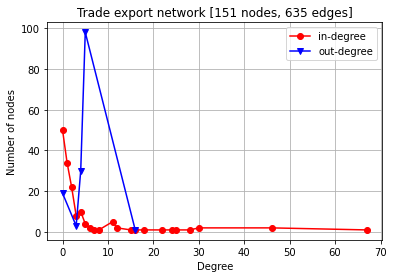

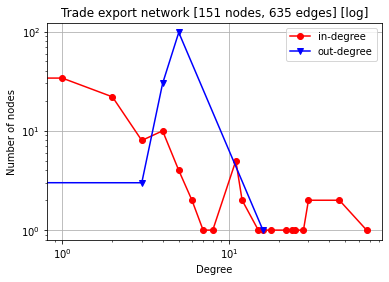

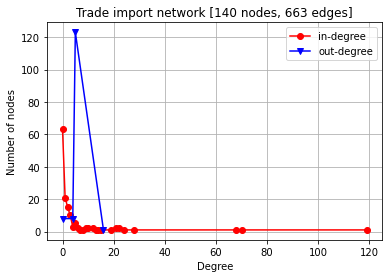

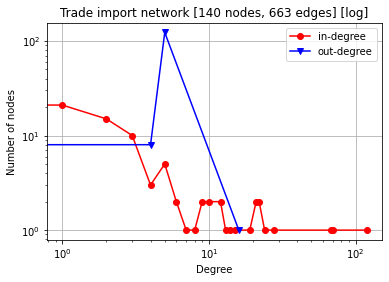

In [21]:
# plot structure of network
plot_graph_degrees(trade_export_g, 'Trade export network', logscale=False)
plot_graph_degrees(trade_export_g, 'Trade export network', logscale=True)
plot_graph_degrees(trade_import_g, 'Trade import network', logscale=False)
plot_graph_degrees(trade_import_g, 'Trade import network', logscale=True)

### Plot nodes and edges

- Generating good network visualisations is non-trivial.
- As a network grows in number of nodes and degree, occlusion becomes inevitable.
- The package provides functionality for advanced plotting (see [documentation](https://networkx.org/documentation/stable/auto_examples/index.html)).
- With a-spatial graphs, it is necessary to choose a **layout** to arrange the nodes in a suitable way.

In [22]:
# define re-usable function to plot network layout
def plot_graph(g, title, edge_label_attribute, layout='spring', fig_sz=10):
    """ 
    Function to plot directed graph with appropriate default values. 
    @ g: a graph
    @ title: title of plot
    @ edge_label_attribute: edge attribute name to use as edge labels 
    @ layout: network layout to use
    @ fig_sz: size of canvas
    """
    # generate positions of nodes based on selected layout
    if layout=='spring':
        pos = nx.spring_layout(g, k=0.55, iterations=30)
    elif layout=='circular':
        pos = nx.circular_layout(g)
    else:
        raise Error("Invalid layout")
    
    # set figure up
    plt.figure(figsize=(fig_sz, fig_sz))
    # open drawing
    nx.draw_networkx(g, pos=pos, node_color='lightblue', alpha=.8)
    # extract edge labels 
    edge_labels = nx.get_edge_attributes(g,edge_label_attribute)
    # draw edge labels
    nx.draw_networkx_edge_labels(g, pos=pos, edge_labels=edge_labels, alpha=.6)
    # draw edges
    nx.draw_networkx_edges(g, pos=pos, arrows=True, alpha=.6, edge_color='lightgray')
    plt.title(title)
    plt.show()

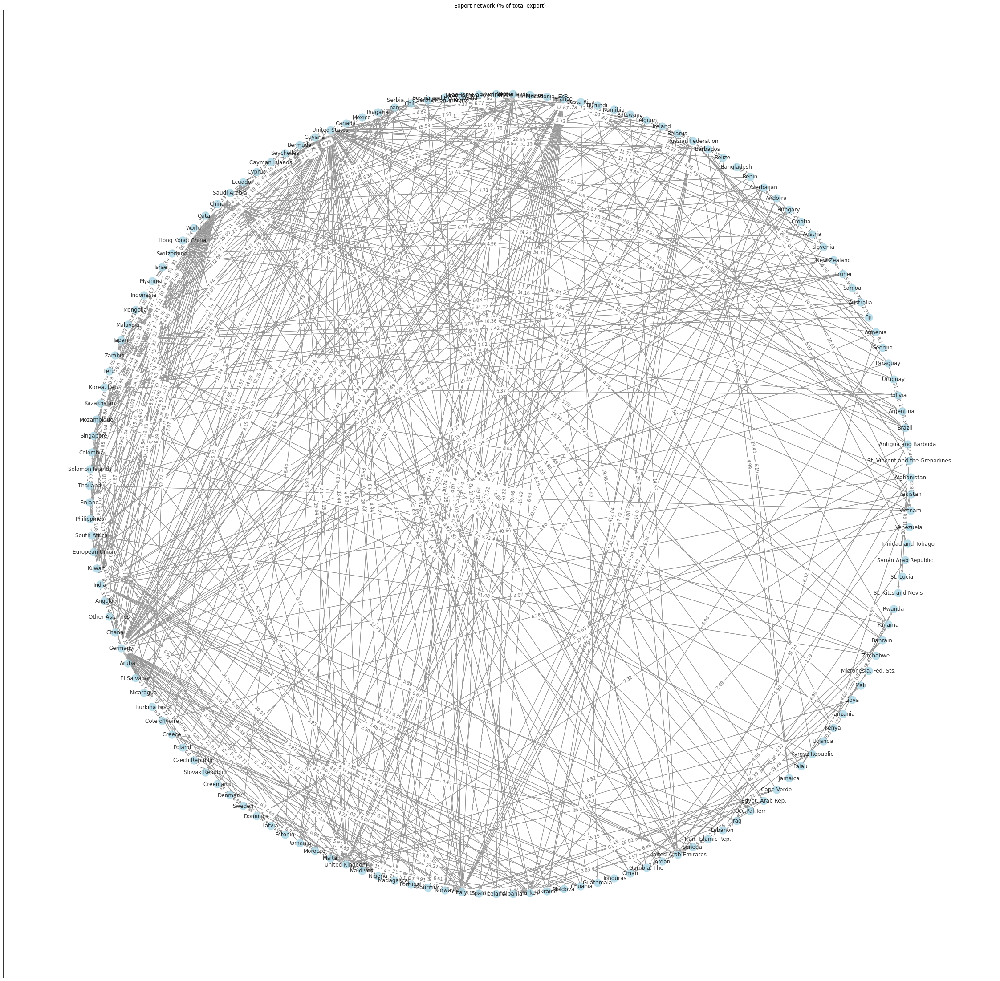

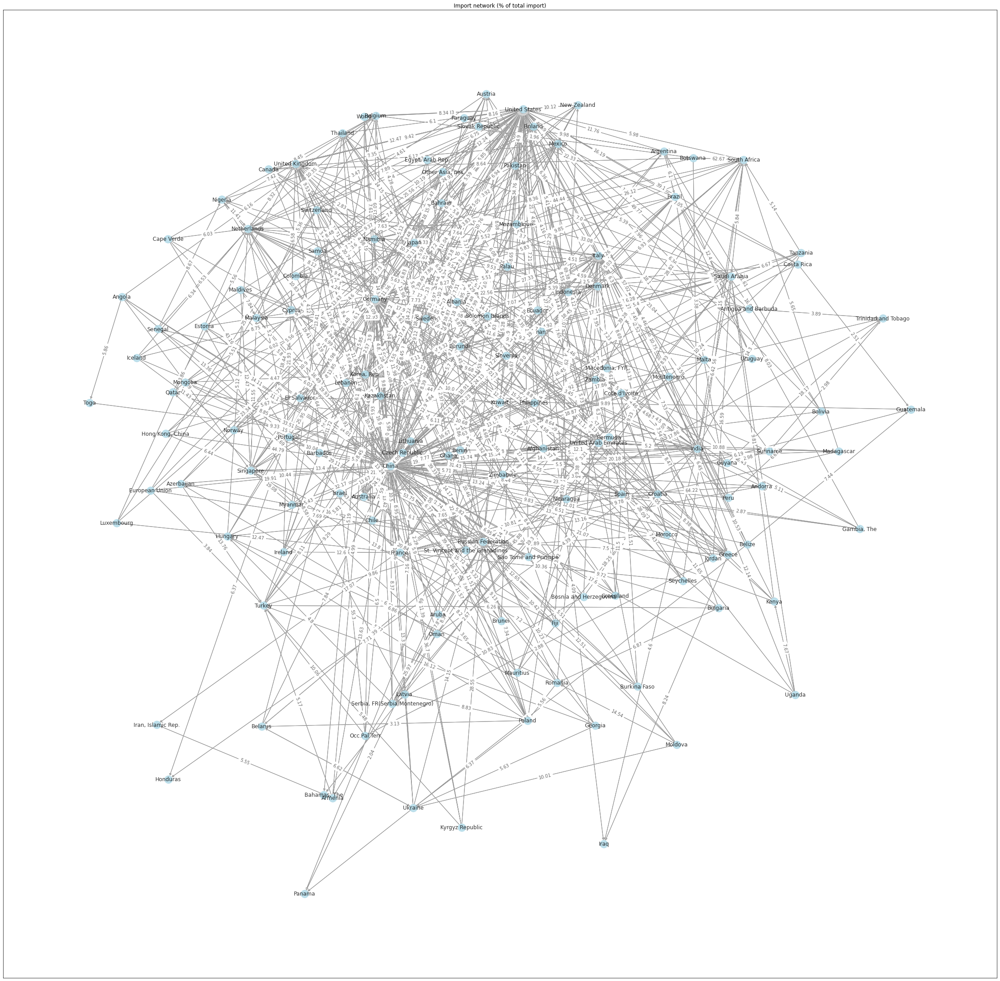

In [23]:
# plot the graph with two different layouts
plot_graph(trade_export_g, "Export network (% of total export)", '2018', 'circular', fig_sz=40)
plot_graph(trade_import_g, "Import network (% of total import)", '2018', 'spring', fig_sz=40)

- These visualisations are essentially useless as we cannot discern the structure of the networks.
- A strategy to visualise a large network is to include only relatively connected nodes.
- For example, let us **select high-degree nodes** from the trade_export_g graph:

In [24]:
degrees = trade_export_g.degree()
nodes_to_remove = [n for n, degree in degrees if degrees[n] < 20]

# copy and remove nodes from graph 
hideg_trade_export_g = trade_export_g.copy()
hideg_trade_export_g.remove_nodes_from(nodes_to_remove)
print(nx.info(hideg_trade_export_g))

Name: 
Type: DiGraph
Number of nodes: 12
Number of edges: 41
Average in degree:   3.4167
Average out degree:   3.4167


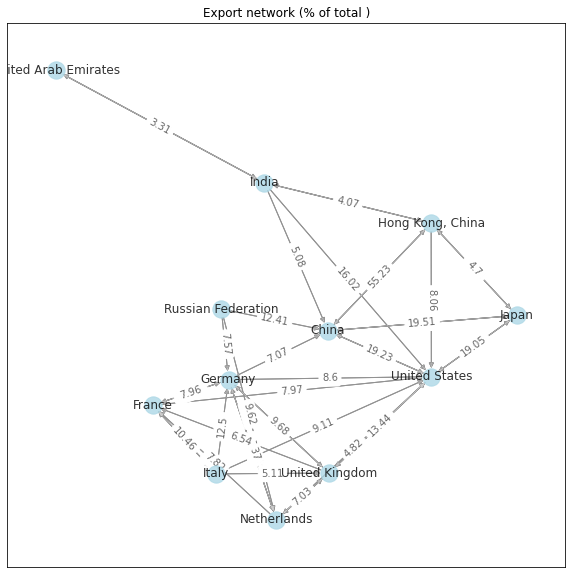

In [25]:
# the high-degree plot is easier to plot and we can see the 
# connections between high-degree countries:
plot_graph(hideg_trade_export_g, "Export network (% of total )", '2018', 'spring', fig_sz=10)

- Another approach is to **select sub-graphs**, for example the neighbours of a target node:

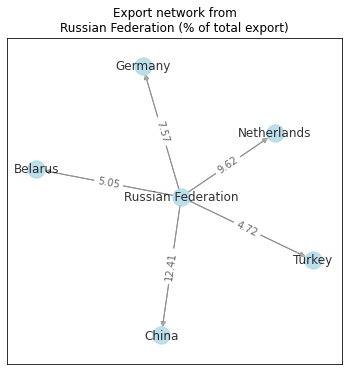

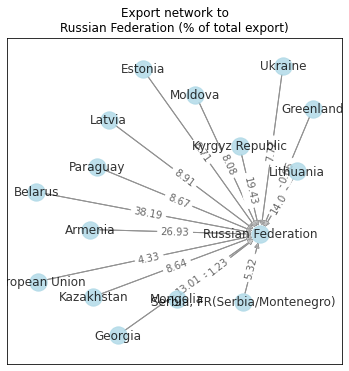

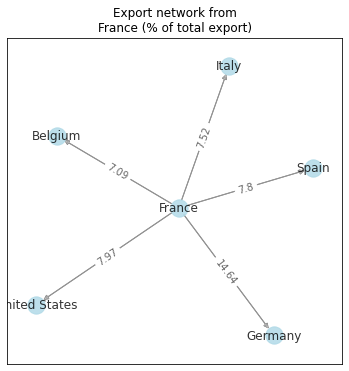

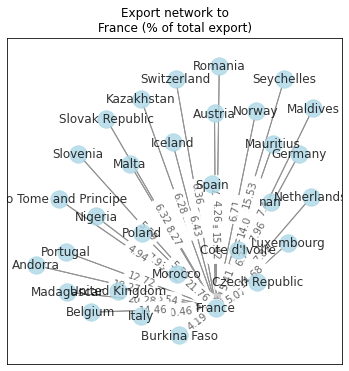

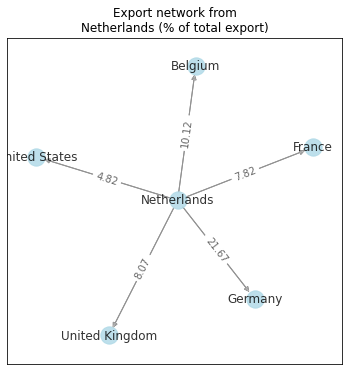

...

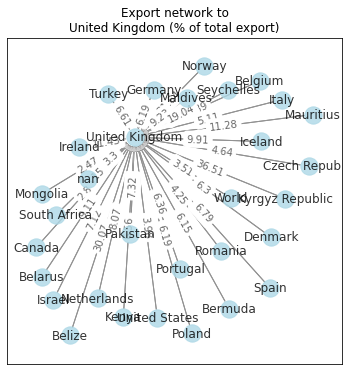

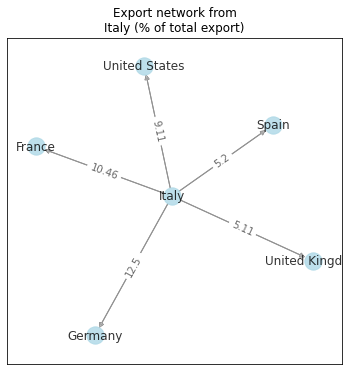

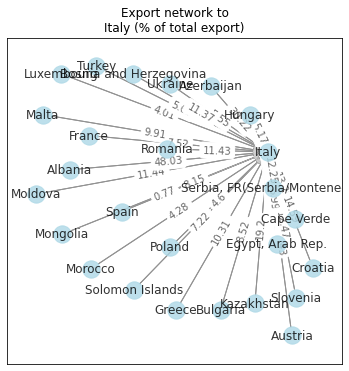

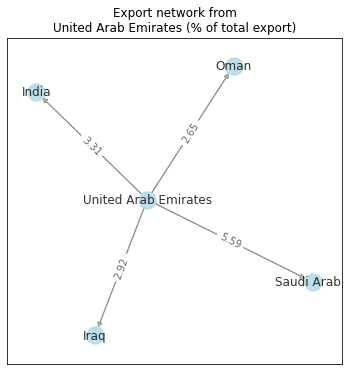

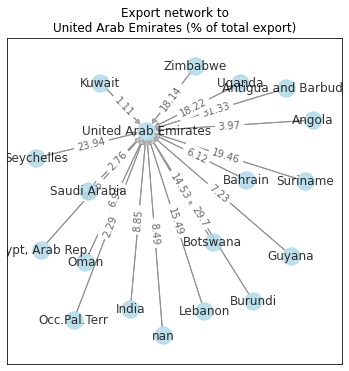

In [26]:
# show sub graphs for each high-degree country 
for country in hideg_trade_export_g.nodes:
    # extract sub graph for the export network of a country
    # out edges
    edges = trade_export_g.out_edges(country, data=True)
    g = nx.DiGraph(edges)
    plot_graph(g, "Export network from\n"+country+' (% of total export)', '2018', fig_sz=6)
    # in edges
    edges = trade_export_g.in_edges(country, data=True)
    g = nx.DiGraph(edges)
    plot_graph(g, "Export network to\n"+country+' (% of total export)', '2018', fig_sz=6)

### Exporting graphs
- It is often necessary to export a graph to a standard file format, for example to manipulate it in other tools, such as Illustrator or **Gephi**, a [good open source tool to visualise network](https://gephi.org).
- `networkx` supports [many formats](https://networkx.org/documentation/stable/reference/readwrite/index.html).
- Among the most supported ones, there are **GraphML** and **GEXF**, both based on XML. Explore the exported files with a text editor to see how the data is encoded.

In [27]:
nx.write_graphml(hideg_trade_export_g, "tmp/street_network.graphml")
nx.write_gexf(hideg_trade_export_g, "tmp/street_network.gexf")

### Node centrality

- We can use `networkx` to calculate network metrics, for example to see the betweenness centrality of countries in the two different networks representing _import_ and _export_:

In [28]:
# calculate betweenness centrality based on density of nodes
country_centrality = nx.algorithms.centrality.betweenness_centrality(trade_export_g)
# convert the data to a data frame
country_centrality_df = pd.DataFrame.from_dict(country_centrality, 
                                orient='index', columns=['betw_centrality_export'])
country_centrality_df['country'] = country_centrality_df.index

# sort and show results
country_centrality_df = country_centrality_df.sort_values('betw_centrality_export', ascending=False)
country_centrality_df.head(10)

,betw_centrality_export,country
United States,0.042676,United States
India,0.033241,India
China,0.031147,China
"Hong Kong, China",0.024218,"Hong Kong, China"
United Arab Emirates,0.023079,United Arab Emirates
United Kingdom,0.018608,United Kingdom
Germany,0.017931,Germany
Japan,0.017918,Japan
France,0.015561,France
Singapore,0.012823,Singapore


In [29]:
# import network
country_centrality = nx.algorithms.centrality.betweenness_centrality(trade_import_g)
imp_df = pd.DataFrame.from_dict(country_centrality, 
                            orient='index', columns=['betw_centrality_import'])
# sort and show results
imp_df = imp_df.sort_values('betw_centrality_import', ascending=False)
imp_df['country'] = imp_df.index
imp_df.head(10)

,betw_centrality_import,country
China,0.040320,China
Japan,0.036756,Japan
Germany,0.029491,Germany
United States,0.026588,United States
Australia,0.019231,Australia
Saudi Arabia,0.016419,Saudi Arabia
Netherlands,0.013404,Netherlands
Thailand,0.012864,Thailand
France,0.010686,France
"Korea, Rep.",0.008756,"Korea, Rep."


In [30]:
# combine the two indicators to compare them
impexp_df = country_centrality_df.merge(imp_df, on='country')
impexp_df = impexp_df[['country','betw_centrality_import','betw_centrality_export']]
impexp_df = impexp_df.sort_values('betw_centrality_export', ascending=False)
impexp_df.to_csv('tmp/trade_importexport_centrality_2018.csv')
impexp_df.head(10)

,country,betw_centrality_import,betw_centrality_export
0,United States,0.026588,0.042676
1,India,0.008226,0.033241
2,China,0.040320,0.031147
3,"Hong Kong, China",0.000000,0.024218
4,United Arab Emirates,0.005016,0.023079
5,United Kingdom,0.003019,0.018608
6,Germany,0.029491,0.017931
7,Japan,0.036756,0.017918
8,France,0.010686,0.015561
9,Singapore,0.001280,0.012823


### Community detection

- When working on networks, one of the most common tasks is the identification of **clusters of nodes** that are particularly inter-connected. This has applications in many areas of network science.
- For example, communities might be college friends on social media platforms, companies that are integrated in the same value chains, traders that tend to buy the same stocks, or areas of a city that exchange high flows of commuters.
- In a graph, a **community** can be defined as a subset of nodes that are densely connected to each other and loosely connected to the nodes in the other communities.

<img src="img/communities.jpg" width=300 />

- Community detection is an intensely studied problem in network science and several techniques exist. 
- `networkx` supports several algorithms (see [documentation](https://networkx.org/documentation/stable/reference/algorithms/community.html)).
- Choosing an appropriate community detection method is non-trivial and depends on the context.

In [31]:
from networkx.algorithms import community

def find_communities(g):
    """ 
    Detect communities using greedy modularity
    @ returns a dictionary with detected communities and their nodes.
    """
    communities = community.greedy_modularity_communities(g)
    res = {}
    for i, comm in enumerate(communities):
        res[i] = [c for c in comm]
    return res

In [32]:
# this method works only with undirected graphs.
trade_import_ug = trade_import_g.to_undirected()

# the method finds 5 communities in this graph
trade_communities = find_communities(trade_import_ug)
for comm_id, countries in trade_communities.items():
    print("\nCommunity",comm_id)
    print(countries)


Community 0
['Armenia', 'Greece', 'Serbia, FR(Serbia/Montenegro)', 'European Union', 'Slovak Republic', 'Kyrgyz Republic', 'Austria', 'Turkey', 'Latvia', 'Germany', 'Estonia', 'Croatia', 'Georgia', 'Finland', 'Kazakhstan', 'Russian Federation', 'Lithuania', 'Italy', 'Switzerland', 'Poland', 'Lebanon', 'Hungary', 'Slovenia', 'Bulgaria', 'Belarus', 'Romania', 'Cyprus', 'Montenegro', 'Occ.Pal.Terr', 'Moldova', 'Israel', 'Albania', 'Ukraine', 'Czech Republic', 'Bosnia and Herzegovina', 'Azerbaijan', 'Macedonia, FYR']

Community 1
['Pakistan', nan, 'Kenya', 'Iraq', 'Mozambique', 'Uganda', 'Maldives', 'Saudi Arabia', 'Seychelles', 'Bahamas, The', 'Qatar', 'Bahrain', 'China', 'South Africa', 'Canada', 'Botswana', 'Zambia', 'Oman', 'Madagascar', 'Namibia', 'India', 'Bermuda', 'Mauritius', 'Burundi', 'Jordan', 'Tanzania', 'United Arab Emirates', 'Afghanistan', 'Iran, Islamic Rep.', 'Egypt, Arab Rep.']

Community 2
['Suriname', 'Guyana', 'Zimbabwe', 'World', 'Australia', 'Korea, Rep.', 'Kuwait'

## Street networks

- Street networks are a type of network that is particularly important in geographic data science.
- The package `osmnx` provides functions to easily extract street networks from OpenStreetMap.
- This is a [tutorial](https://geoffboeing.com/2016/11/osmnx-python-street-networks) on the package. For more details, see the journal article by Boeing (2017) ([see PDF](https://www.researchgate.net/publication/309738462_OSMNX_New_Methods_for_Acquiring_Constructing_Analyzing_and_Visualizing_Complex_Street_Networks)).
- The most efficient way to save these networks when working on them in Python is the **pickle format**. In this notebook we will use gzipped pickle files.
- Many other network formats exist, including **GeoPackages**, and **GraphML** that can be used to share networks across platforms.


### Retrieve street networks

In [33]:
# target place name
place_name = "City of London, UK"

# download street network from OpenStreetMap based on a place name
# the network_type parameter (options: drive, walk and bike).
graph = osmnx.graph_from_place(place_name, network_type='drive')

# save network on disk using gzip (.gz) to reduce the file size
net_file = "data/streets_citylondon.gpik.gz"
nx.write_gpickle(graph, net_file)

print("Graph file of streets in",place_name,"downloaded at",net_file)

# 'del' (delete) destroys an object. It is useful to make sure that this object
# cannot be used in other cells by mistake.
del graph, net_file

Graph file of streets in City of London, UK downloaded at data/streets_citylondon.gpik.gz


- Alternatively, the package supports a **point and radius search** based on addresses or from polygons:

In [34]:
# location of Birkbeck, 1 km radius 
radius_m = 1000
graph = osmnx.graph_from_address('Malet St, London, UK', network_type='drive', dist=radius_m)
nx.write_gpickle(graph, "data/streets_birkbeck_1km.gpik.gz")
del graph

### Plot street network
- The street network is expressed as a `networkx.classes.multidigraph.MultiDiGraph`.
- Let us load a pickle file and plot the network.

In [35]:
net_file = "data/streets_birkbeck_1km.gpik.gz"
streets_g = nx.read_gpickle(net_file)

print("N of nodes:",len(streets_g.nodes))
print("N of edges:",len(streets_g.edges))

N of nodes: 773
N of edges: 1534


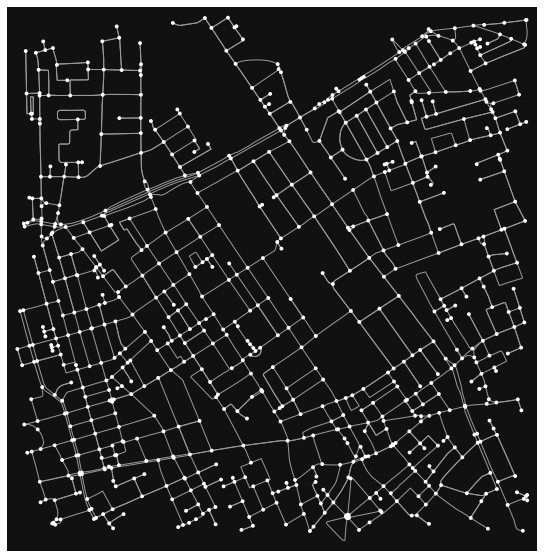

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

In [36]:
# plot network
osmnx.plot_graph(streets_g, figsize=(10,10))

- Edges contain attributes, such as street name and type, which can be accessed as a geographic data frame.

In [37]:
# Retrieve only edges from the graph
edges_df = osmnx.graph_to_gdfs(streets_g, nodes=False, edges=True)
edges_df.sample(3)

,,,osmid,name,highway,maxspeed,oneway,length,geometry,lanes,ref,access,bridge,tunnel,junction
u,v,key,,,,,,,,,,,,,
107328,21665000,0,4082564,Frith Street,residential,20 mph,True,98.842,"LINESTRING (-0.13231 51.51482, -0.13175 51.51400)",NaN,NaN,NaN,NaN,NaN,NaN
25472762,25472764,0,"[685539696, 4253607]",Barter Street,unclassified,20 mph,False,49.977,"LINESTRING (-0.12277 51.51769, -0.12309 51.517...",NaN,NaN,NaN,NaN,NaN,NaN
294158423,294158425,0,26815503,Chester Close South,residential,20 mph,False,20.494,"LINESTRING (-0.14476 51.52768, -0.14476 51.527...",NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

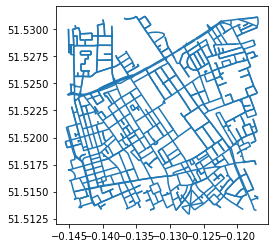

In [38]:
edges_df.plot()

- Nodes can have attributes too, such as the location and number of intersecting edges:

In [39]:
# Retrieve nodes from the graph as a data frame
nodes_df = osmnx.graph_to_gdfs(streets_g, nodes=True, edges=False)
nodes_df.sample(5)

,y,x,street_count,highway,geometry
osmid,,,,,
332041579,51.520673,-0.134967,2,NaN,POINT (-0.13497 51.52067)
21533914,51.519635,-0.139508,3,NaN,POINT (-0.13951 51.51964)
5517569293,51.519467,-0.117992,1,NaN,POINT (-0.11799 51.51947)
200052,51.524045,-0.145012,3,NaN,POINT (-0.14501 51.52404)
282688899,51.530916,-0.139992,1,NaN,POINT (-0.13999 51.53092)


<AxesSubplot:>

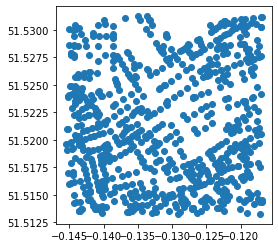

In [40]:
# plot nodes
nodes_df.plot()

### Project network

- To work on street networks, it is necessary to project them to an appropriate **coordinate reference system**.

In [41]:
print("Coordinate system of nodes:", nodes_df.crs)
print("Coordinate system of edges:", edges_df.crs)

Coordinate system of nodes: epsg:4326
Coordinate system of edges: epsg:4326


- Project this street network to the British National Grid (https://epsg.io/27700):

In [42]:
streets_g = osmnx.project_graph(streets_g, 27700)

# check if projection worked
nodes_proj, edges_proj = osmnx.graph_to_gdfs(streets_g, nodes=True, edges=True)
print(nodes_proj.crs)
print(edges_proj.crs)
# all good

epsg:27700
epsg:27700


In [43]:
# now the coordinates are projected:
edges_proj.sample(5)

,,,osmid,name,highway,maxspeed,oneway,length,geometry,lanes,ref,tunnel,access,bridge,junction
u,v,key,,,,,,,,,,,,,
4243601481,4243601512,0,"[425013568, 425013571, 425013579]",Stephen Street,unclassified,20 mph,True,45.710,"LINESTRING (529679.139 181544.887, 529682.283 ...",1,NaN,NaN,NaN,NaN,NaN
11544696,7684041426,0,823004754,Dane Street,unclassified,20 mph,False,15.209,"LINESTRING (530622.046 181683.648, 530628.976 ...",NaN,NaN,NaN,NaN,NaN,NaN
25472672,107853,0,319017443,Great Russell Street,tertiary,20 mph,False,38.207,"LINESTRING (530045.266 181549.970, 530021.858 ...",2,NaN,NaN,NaN,NaN,NaN
25472766,25472762,0,4253606,Barter Street,unclassified,20 mph,False,74.245,"LINESTRING (530407.967 181574.754, 530346.650 ...",NaN,NaN,NaN,NaN,NaN,NaN
25472672,25472654,0,319017443,Great Russell Street,tertiary,20 mph,False,27.762,"LINESTRING (530045.266 181549.970, 530054.060 ...",2,NaN,NaN,NaN,NaN,NaN


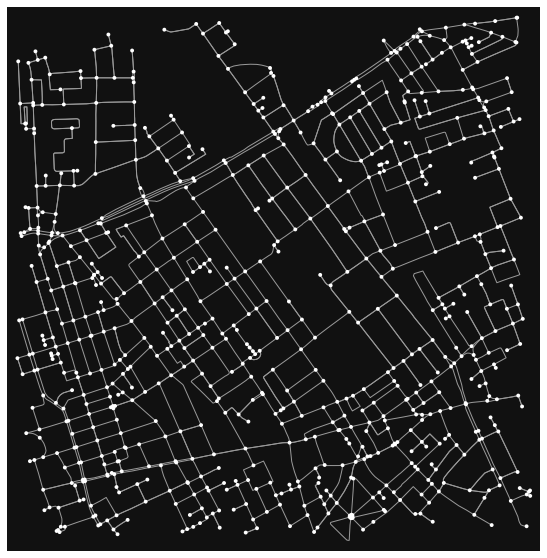

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

In [44]:
# plot the projected graph. The difference is not immediately visible as 
# the area is fairly small:
osmnx.plot_graph(streets_g, figsize=(10,10))

### Analyse network
- Street networks can be analysed in terms of their structure (morphology), using a variety of indicators:

In [45]:
basic_stats = osmnx.basic_stats(streets_g)
basic_stats

{'n': 773,
 'm': 1534,
 'k_avg': 3.9689521345407504,
 'intersection_count': 667,
 'streets_per_node_avg': 2.8874514877102198,
 'streets_per_node_counts': {0: 0, 1: 106, 2: 29, 3: 488, 4: 146, 5: 4},
 'streets_per_node_proportion': {0: 0.0,
  1: 0.1371280724450194,
  2: 0.037516170763260026,
  3: 0.6313065976714101,
  4: 0.1888745148771022,
  5: 0.00517464424320828},
 'edge_length_total': 106284.37599999987,
 'edge_length_avg': 69.28577314211205,
 'street_length_total': 74624.08399999996,
 'street_length_avg': 69.35323791821557,
 'street_segments_count': 1076,
 'node_density_km': None,
 'intersection_density_km': None,
 'edge_density_km': None,
 'street_density_km': None,
 'circuity_avg': 1.2097025606738678e-05,
 'self_loop_proportion': 0.001303780964797914,
 'clean_intersection_count': None,
 'clean_intersection_density_km': None}

### Calculating paths

- A central part in routing is calculating shortest paths in street networks.

Origin node: 108004 , destination node: 427931762
Driving route found: 27 segments; length (m) 1675


<Figure size 432x432 with 0 Axes>

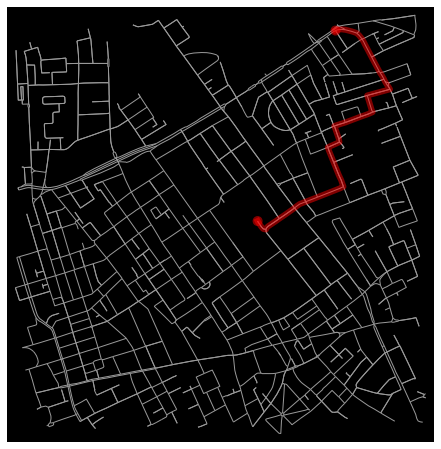

In [46]:
# select two random nodes
nodes = [n for n in streets_g.nodes]
orig_node = random.choice(nodes)
dest_node = random.choice(nodes)
print("Origin node:", orig_node, ", destination node:", dest_node)

# try/except is necessary because sometimes paths cannot be found
try:
    # find shortest path between the two nodes.
    route = nx.shortest_path(streets_g, orig_node, dest_node, weight='length')
    route_len_m = nx.shortest_path_length(streets_g, orig_node, dest_node, weight='length')
    print("Driving route found:", len(route), "segments; length (m)", round(route_len_m))
    # plot route
    plt.figure(figsize=(6, 6))
    fig, ax = osmnx.plot_graph_route(streets_g, route, route_linewidth=6, node_size=0, bgcolor='k')
except NetworkXNoPath as e: 
    print("Route not found", e)

In [47]:
# ret = call_some_function()
# if ret is an error: do something

try:
    ret = 10 / 0
except:
    print("Something went wrong")

Something went wrong


- When routing from a point A to point B, the first step is to find the nearest nodes to A and B.
- In this case, we need to transform the points from lon/lat to BNG coordinates:

In [48]:
from pyproj import Transformer

def project_points(points, in_epsg_code, out_epsg_code):
    """ Transform points from an EPSG to another 
    @ in_epsg_code: origin EPSG code of SRS
    @ out_epsg_code: target EPSG code of SRS
    """
    transformer = Transformer.from_crs(in_epsg_code, out_epsg_code, always_xy=True)
    proj_points = [pt for pt in transformer.itransform(points)]
    return proj_points

In [49]:
# origin and destination (lonx, laty)
birkbeck_loc = [-0.13134307, 51.522510]
british_museum_loc = [-0.12575, 51.518391]

# transform location to British Grid (get first element with [0])
birkbeck_loc_bg = project_points([birkbeck_loc], 4326, 27700)[0]
britishmus_loc_bg = project_points([british_museum_loc], 4326, 27700)[0]
print("Locations in BNG: ", birkbeck_loc_bg, britishmus_loc_bg)

Locations in BNG:  (529738.212649161, 182053.8575961322) (530137.9480571757, 181605.74324911408)


In [50]:
# get nearest nodes. Note that the (strangely) the function takes y,x points, 
# so we have to swap them
birkbeck_node = osmnx.get_nearest_node(streets_g, [birkbeck_loc_bg[1],birkbeck_loc_bg[0]], method='euclidean')
britishmus_node = osmnx.get_nearest_node(streets_g, [britishmus_loc_bg[1],britishmus_loc_bg[0]], method='euclidean')
print("Closest nodes (IDs):", birkbeck_node, britishmus_node)

Closest nodes (IDs): 108006 107852


Route between Birkbeck and the British Museum found: 12 segments; length (m) 1675


<Figure size 432x432 with 0 Axes>

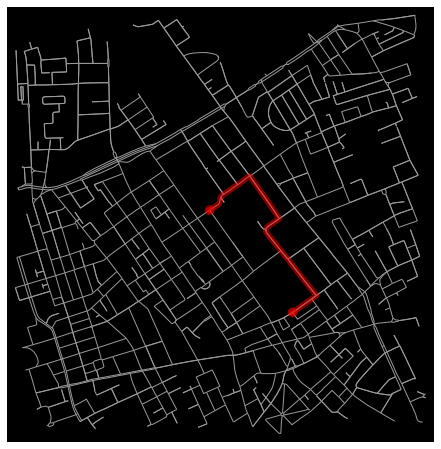

In [51]:
# calculate driving route
route = nx.shortest_path(streets_g, birkbeck_node, britishmus_node, weight='length')
route_len_m = nx.shortest_path_length(streets_g, orig_node, dest_node, weight='length')
print("Route between Birkbeck and the British Museum found:", len(route), "segments; length (m)", round(route_len_m))

# plot route
plt.figure(figsize=(6, 6))
fig, ax = osmnx.plot_graph_route(streets_g, route, route_linewidth=6, node_size=0, bgcolor='k')

- It is possible to use this network data and tools in countless applications.

End of notebook